<a href="https://colab.research.google.com/github/FawwazZahranFirzananda/PCVK_Ganjil_2023/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**D. LATIHAN PRAKTIKUM**

Import beberapa library dan akses folder yang ada di Drive.

# **Object Detection**

Metode yang digunakan:


1. Template Matching
2. Edge Detection
3. Corner Detection
4. Grid Detection
5. Contour Detection

In [14]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [15]:
#akses drive
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2.	Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.

# **Template Matching**

Menggunakan library openCV:

**cv.matchTemplate()**, dengan parameter:


*   **image**: citra input
*   **templ**: template yang dicari, ukurannya tidak boleh lebih besar dari citra input
*   **method**: metode dari template matching

Jenis metode template matching di OpenCV:
1. TM_SQDIFF
2. TM_SQDIFF_NORMED
3. TM_CCORR
4. TM_CCORR_NORMED
5. TM_CCOEFF
6. TM_CCOEFF_NORMED

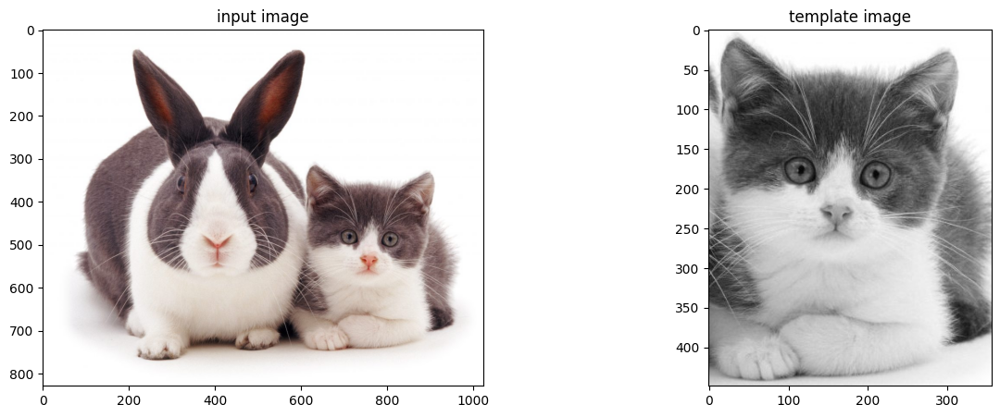

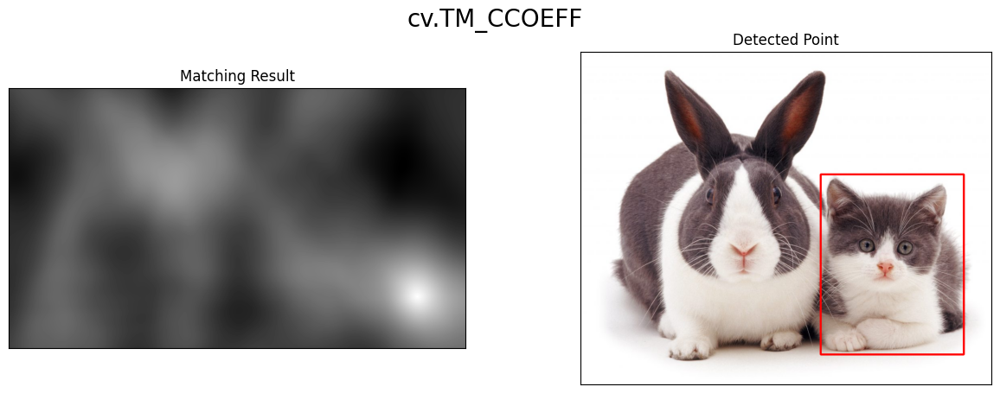

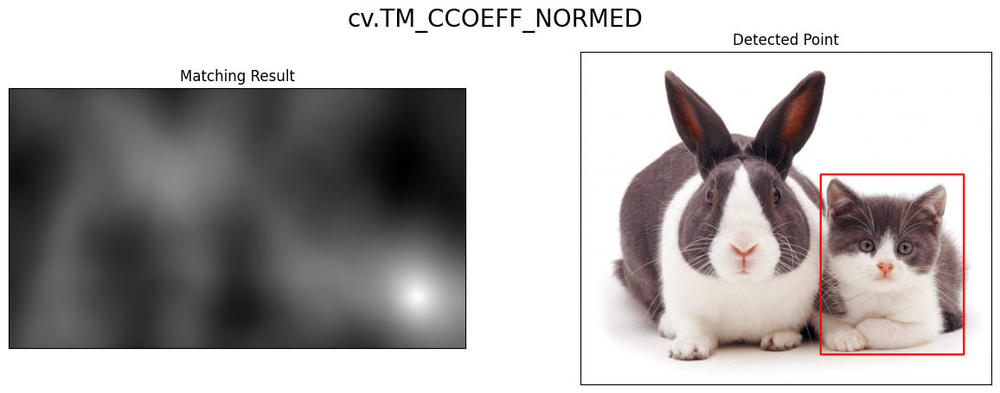

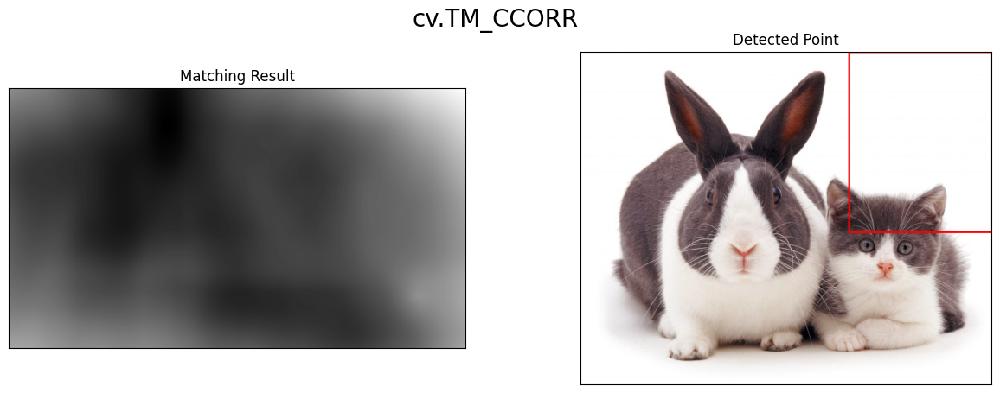

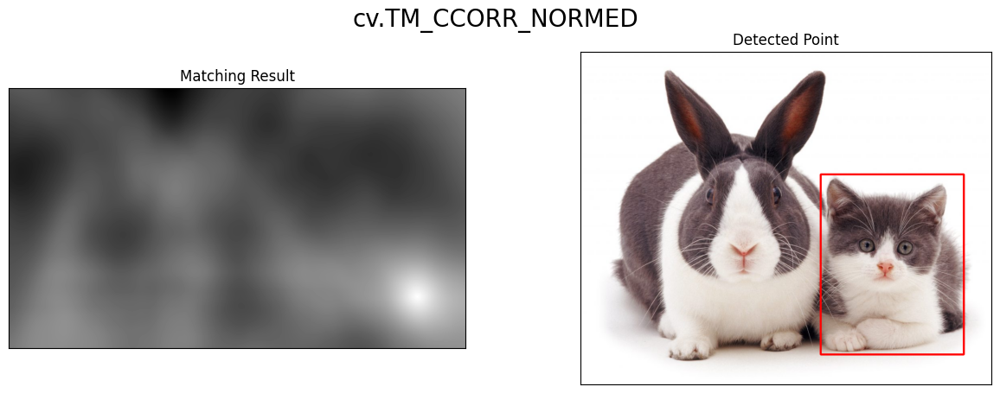

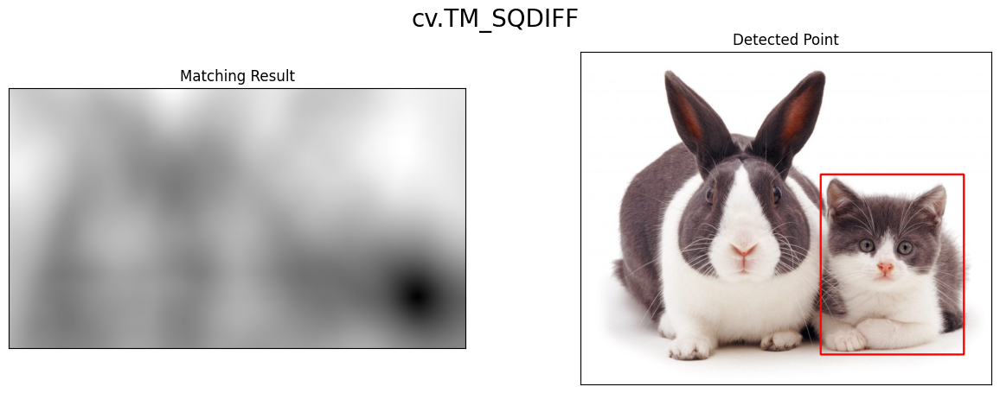

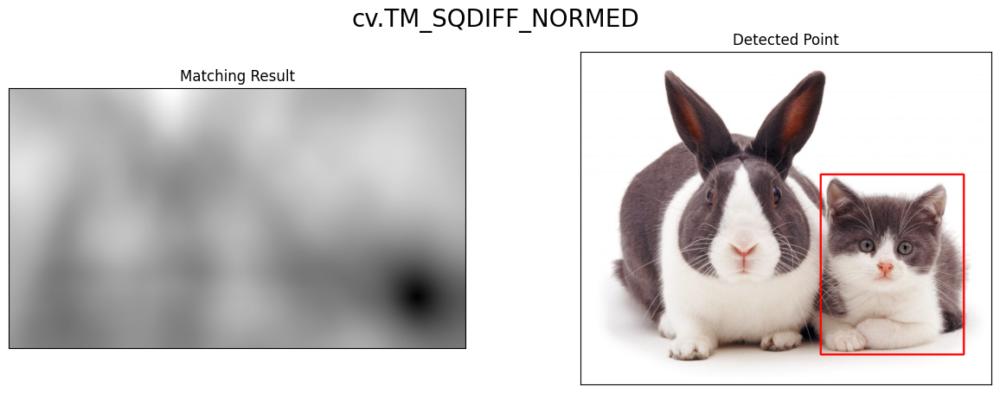

In [16]:
#load citra input
img = cv.imread('/content/drive/MyDrive/Object Detection/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load citra template
template = cv.imread('/content/drive/MyDrive/Object Detection/cat2_templatejpg.jpg',0)
#dimensi citra
w, h = template.shape[::-1]

#print input image dan template
f, axarr = plt.subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

#membuat array untuk menampung 6 jenis metode template matching yang disediakan openCV
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

#perulangan untuk setiap elemen yang ada di array methods
for meth in methods:
    img = img2.copy()
    method = eval(meth)

    #memanggil metode template matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)

    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right, (0, 0, 255), 3)
    plt.figure(figsize = (15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)

    plt.show()

3.	Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template.

total objects found  6


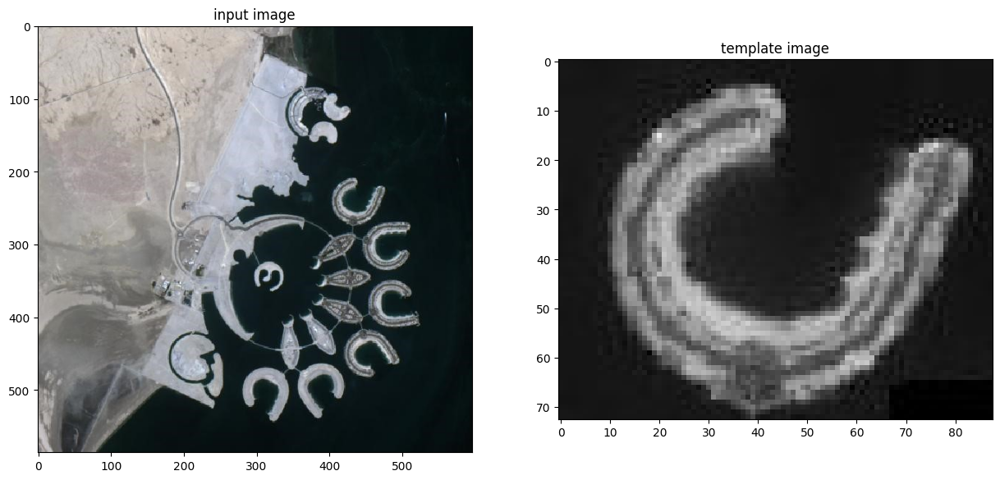

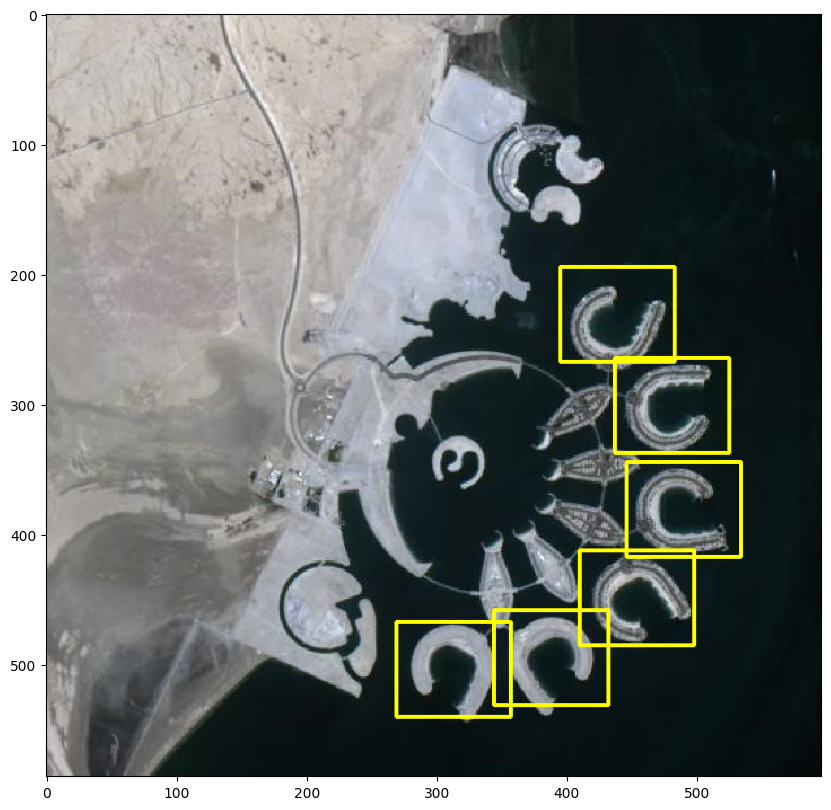

In [17]:
#load citra input
img = cv.imread('/content/drive/MyDrive/Object Detection/bahrain.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

#load citra template
template = cv.imread('/content/drive/MyDrive/Object Detection/bahrain-template.jpg',0)
#dimensi citra
w, h = template.shape[::-1]

f, axarr = plt.subplots(1,2,figsize=(15,35)) #membuat 2 plot untuk citra input dan template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

res = cv.matchTemplate(img_gray,template,cv.TM_CCOEFF_NORMED)

threshold = 0.45
loc = np.where( res >= threshold)

#membuat 2 list untuk menampung koordinat x,y dan variable count untuk menampung jumlah objek
lspoint=[]
lspoint2=[]
count = 0

for pt in zip(*loc[::-1]):
	#cek apakah koordinat sudah terdapat pada list, jika sudah.. skip
	if pt[0] not in lspoint and pt[1] not in lspoint2:
		##menggambar kotak batas
		cv.rectangle(img, pt, (pt[0] + w, pt[1] + h), (0,255,255), 2)
		for i in range(((pt[0])-9), ((pt[0])+9),1):
			#masukkan koordinat x
			lspoint.append(i)
		for k in range(((pt[1])-9), ((pt[1])+9),1):
			#masukkan koordinat y
			lspoint2.append(k)
		count+=1
	else:
		continue
print ("total objects found ", count)

plt.figure(figsize=(10,45))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

4.	Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg.

a. Sobel Edge Detection


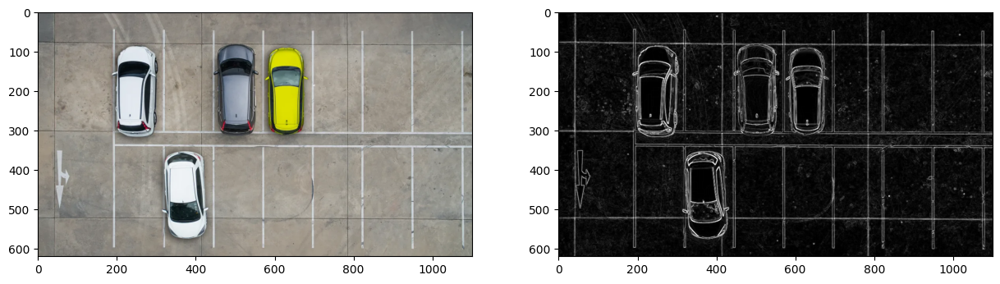

In [18]:
print('a. Sobel Edge Detection')
#load citra input
input_img = cv.imread('/content/drive/MyDrive/Object Detection/car-park.jpg')
gray_img = cv.cvtColor(input_img,cv.COLOR_BGR2GRAY)

grad_x = cv.Sobel(gray_img, cv.CV_64F, 1, 0, ksize=3)
grad_y = cv.Sobel(gray_img, cv.CV_64F, 0, 1, ksize=3)

abs_grad_x = cv.convertScaleAbs(grad_x)
abs_grad_y = cv.convertScaleAbs(grad_y)


grad = cv.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

f, axarr = plt.subplots(1,2,figsize = (15,5)) #membuat 2 plot untuk citra input dan output
axarr[0].imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
axarr[1].imshow(grad, cmap='gray')

b. Canny Edge Detection


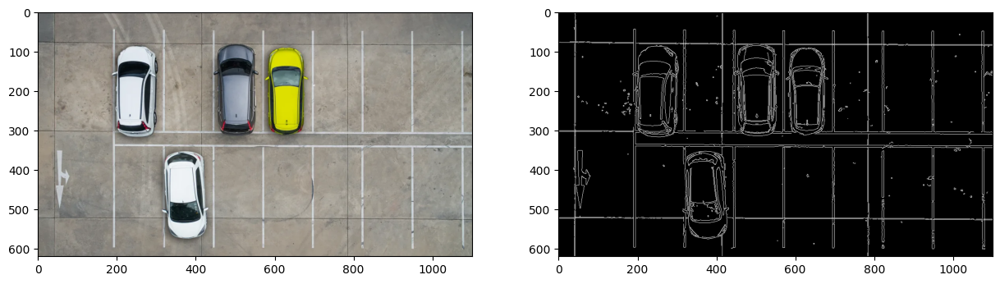

In [19]:
print('b. Canny Edge Detection')
output_canny = cv.Canny(gray_img, 100, 200)

f, axarr = plt.subplots(1,2,figsize = (15,5)) #membuat 2 plot untuk citra input dan output
axarr[0].imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
axarr[1].imshow(output_canny, cmap='gray')

c. Laplacian Edge Detection


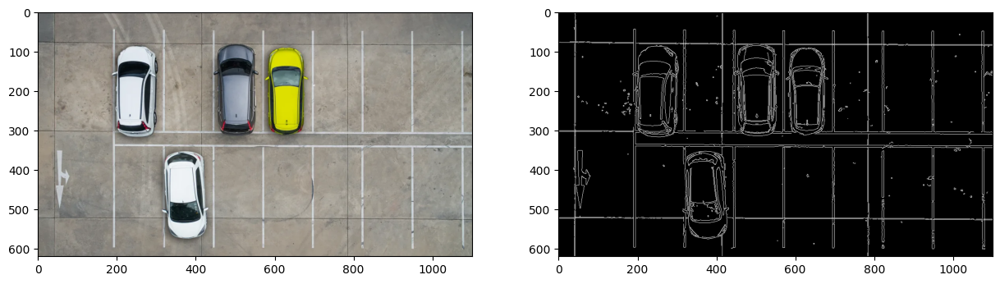

In [20]:
print('c. Laplacian Edge Detection')
output_laplacian = cv.Laplacian(gray_img, cv.CV_64F, 3)

f, axarr = plt.subplots(1,2,figsize = (15,5)) #membuat 2 plot untuk citra input dan output
axarr[0].imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
axarr[1].imshow(output_canny, cmap='gray')

5.	Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chess-board.jpg.

a. Harris Corner Detection


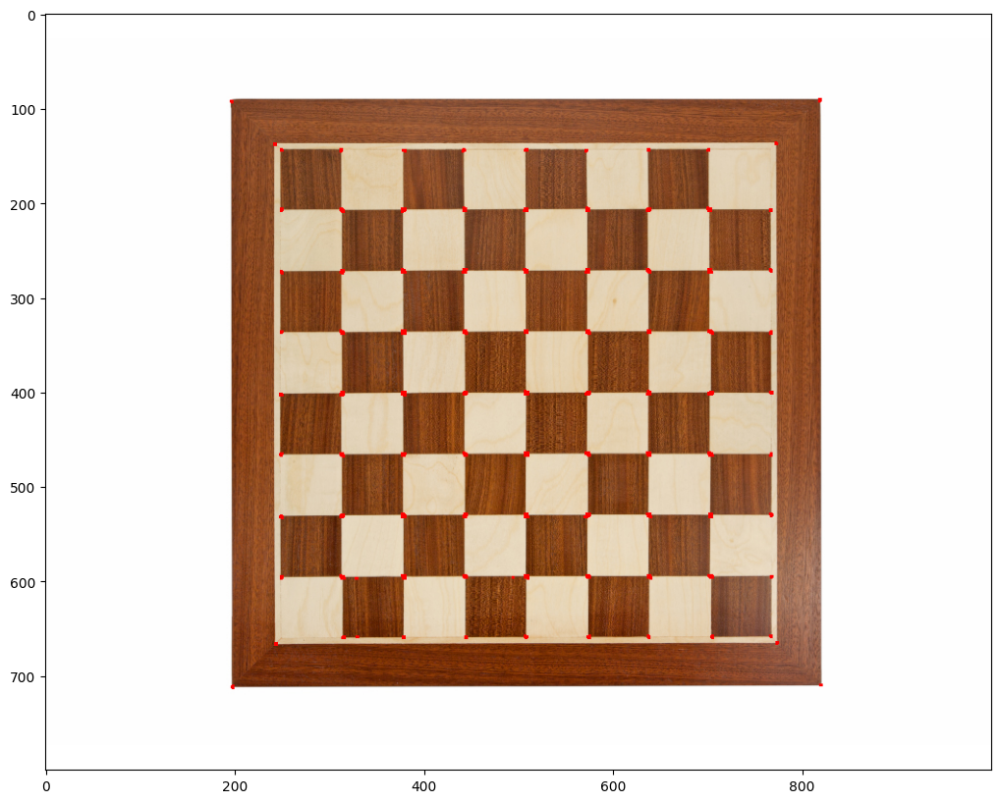

In [21]:
print('a. Harris Corner Detection')
#load citra input
input_img = cv.imread('/content/drive/MyDrive/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img,cv.COLOR_BGR2GRAY)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3,0.04)

#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output,None)

#Threshold untuk mengoptimalkan nilai
input_img[harris_output>0.01*harris_output.max()]=[0,0,255]

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))


b. Shi-Tomasi Detection


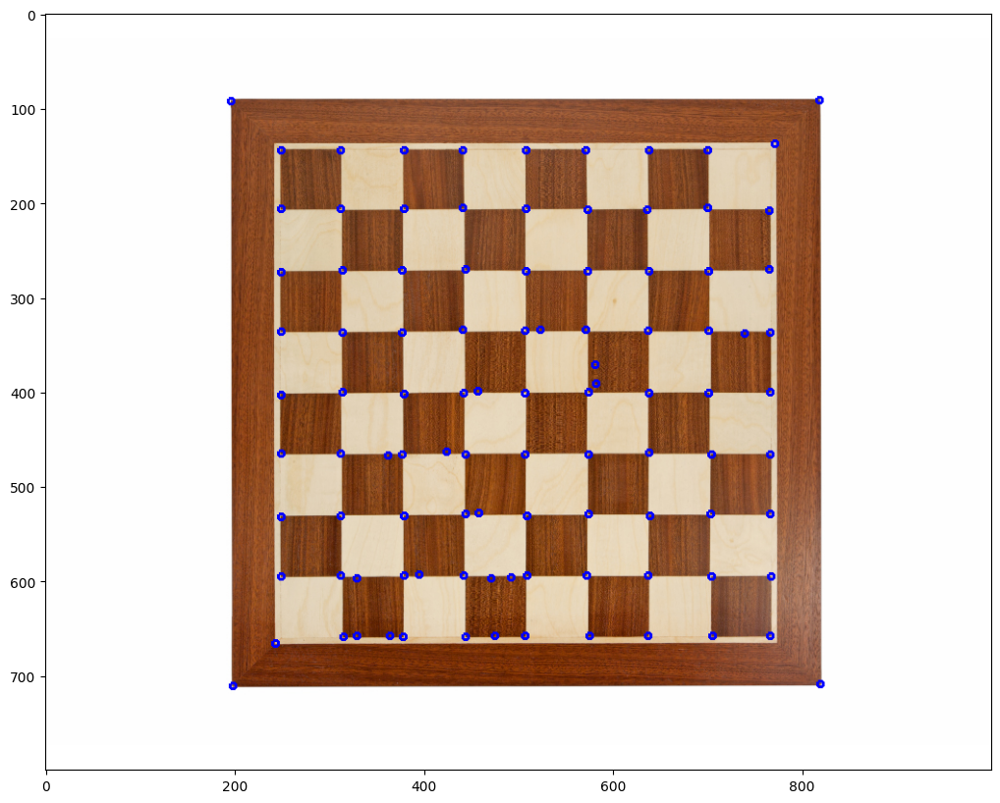

In [22]:
print('b. Shi-Tomasi Detection')
input_img = cv.imread('/content/drive/MyDrive/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img,cv.COLOR_BGR2GRAY)

corners = cv.goodFeaturesToTrack(gray_img,100,0.01,10)
corners = np.int0(corners)
for i in corners:
    x,y = i.ravel()
    cv.circle(input_img,(x,y),3,255,2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

6.	Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg.

number of Hough lines: 33
Number of filtered lines: 20


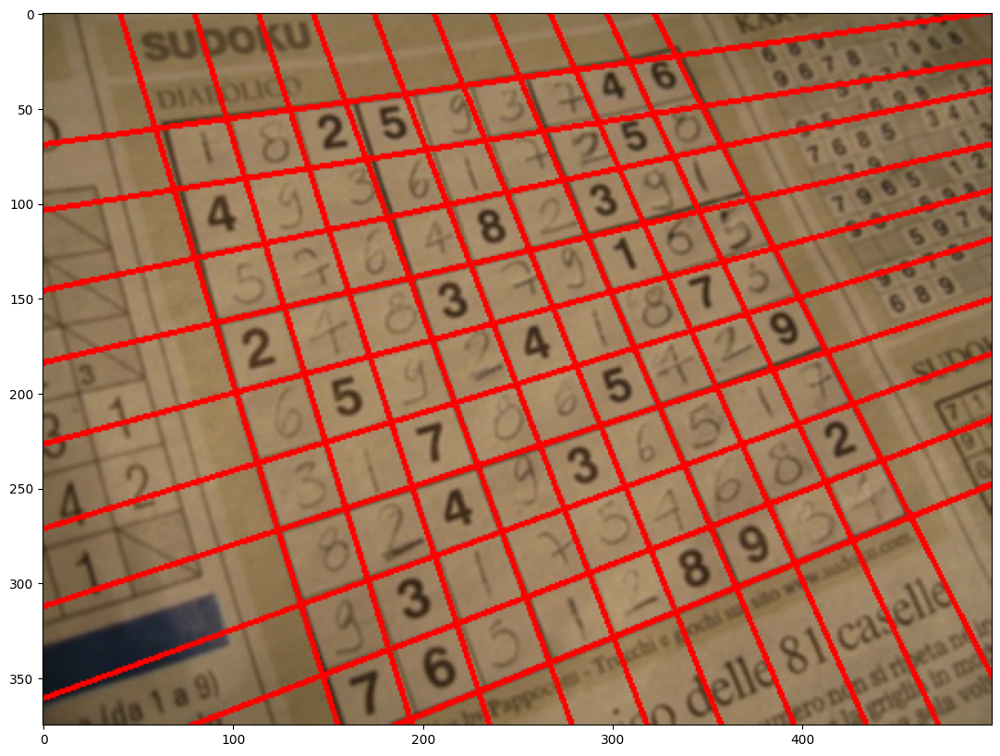

In [23]:
input_img = cv.imread('/content/drive/MyDrive/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img,cv.COLOR_BGR2GRAY)

edges = cv.Canny(img_gray,90,150,apertureSize = 3)

kernel = np.ones((3,3),np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5),np.uint8)
edges = cv.erode(edges,kernel,iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)

if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1

    # berapa banyak baris yang mirip dengan yang diberikan
    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(len(lines)):
            if i == j:
                continue

            rho_i,theta_i = lines[i][0]
            rho_j,theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    # mengurutkan indeks garis dengan melihat seberapa banyak yang mirip dengannya
    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x : len(similar_lines[x]))

    # line flags sebagai dasar filtering
    line_flags = len(lines)*[True]
    for i in range(len(lines) - 1):
        if not line_flags[indices[i]]: #jika elemen ke-i tidak dimasukkan, maka akan diabaikan
            continue

        for j in range(i + 1, len(lines)): # hanya mempertimbangkan elemen-elemen yang memiliki garis yang kurang mirip
            if not line_flags[indices[j]]:
                continue

            rho_i,theta_i = lines[indices[i]][0]
            rho_j,theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[indices[j]] = False

print('number of Hough lines:', len(lines))

filtered_lines = []

if filter:
    for i in range(len(lines)): # filtering
        if line_flags[i]:
            filtered_lines.append(lines[i])

    print('Number of filtered lines:', len(filtered_lines))
else:
    filtered_lines = lines

for line in filtered_lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv.line(input_img,(x1,y1),(x2,y2),(0,0,255),2)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

7.	Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg.

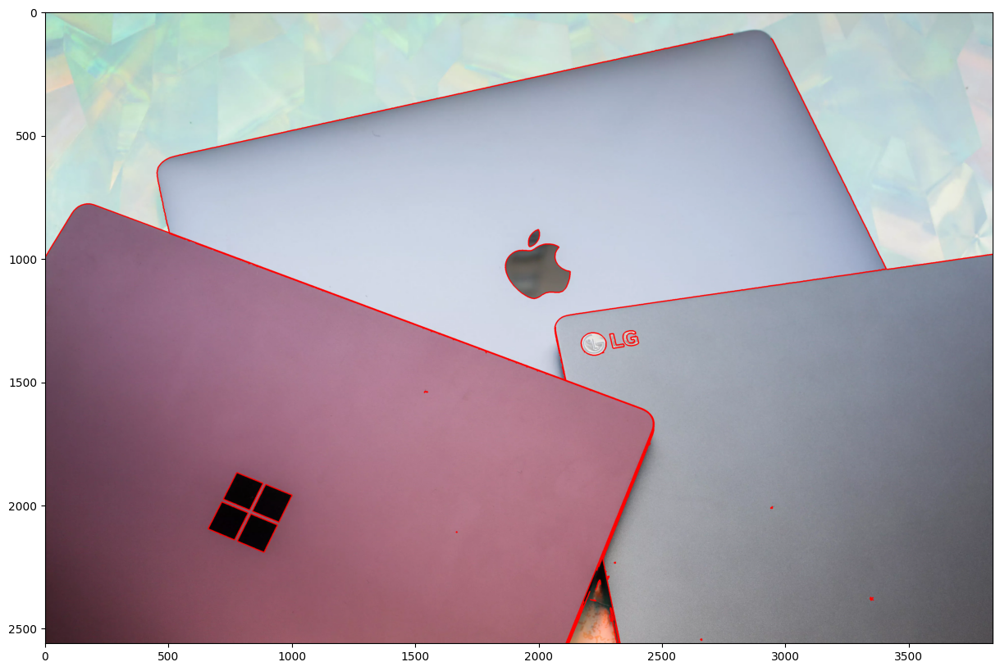

In [24]:
#load citra input
img = cv.imread('/content/drive/MyDrive/Object Detection/laptop.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)

edged = cv.Canny(img_gray, 30, 200)

#ret, thresh = cv.threshold(img_gray, 127, 255, 0)
contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)


cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

**E. Pengayaan Materi KTP**

1.	Siapkan file dataset.

2.	Muat 2 library.

In [25]:
import cv2
import os

3.	Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut.

4.	Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle dapat direduksi.

5.	Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan binerisasi citra.

165.0 (300, 493)


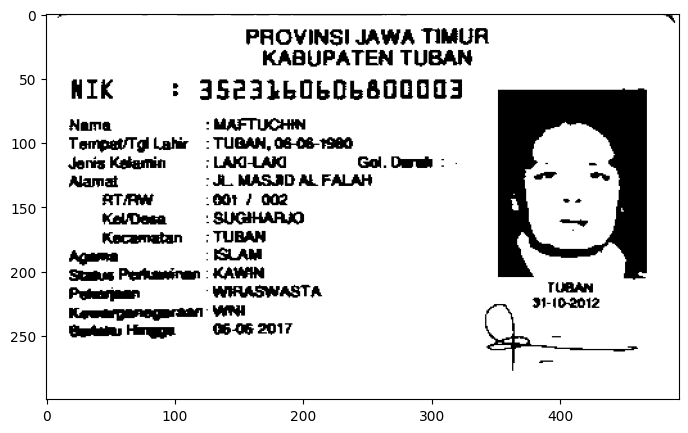

In [26]:
# lokasi dataset
path = "/content/drive/MyDrive/KTP_More/ktp4.png"
src = cv2.imread(path)
blurred = src.copy()
gray =blurred.copy()

# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print(ret, bw.shape)

# Tampilkan gambar hasil
f, axarr = plt.subplots(figsize=(15,5))
axarr.imshow(bw, cmap='gray')
plt.show()

6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan.

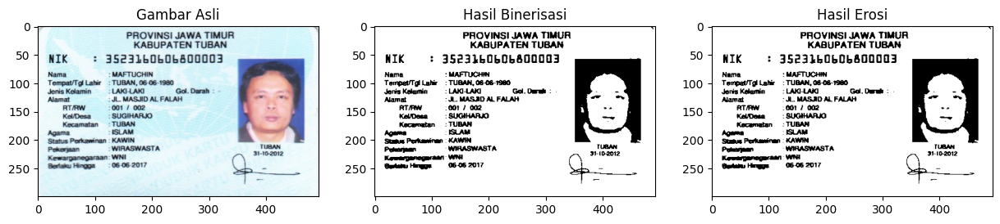

In [27]:
erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

# Tampilkan gambar asli, hasil binerisasi, dan hasil erosi
f, axarr = plt.subplots(1, 3, figsize=(15, 5))
axarr[0].imshow(cv2.cvtColor(src, cv2.COLOR_BGR2RGB))
axarr[0].set_title("Gambar Asli")
axarr[1].imshow(bw, cmap='gray')
axarr[1].set_title("Hasil Binerisasi")
axarr[2].imshow(erode, cmap='gray')
axarr[2].set_title("Hasil Erosi")
plt.show()

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek. Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik (karena hasil akuisisi setiap citra dapat berbeda).

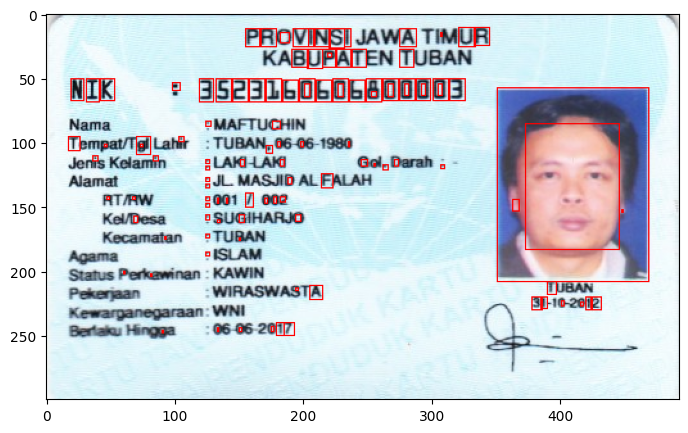

In [28]:
blurred = cv.GaussianBlur(src, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 4 and w >= 1 and float(ras) <= 1:
      cv.rectangle(src, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 2 and w >= 1 and float(ras) <= 1:
      cv.rectangle(src, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

plt.figure(figsize=(10,5))
plt.imshow(cv.cvtColor(src, cv.COLOR_BGR2RGB))

**F. Tugas Praktikum**

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah.

In [31]:
import cv2
from google.colab.patches import cv2_imshow

KTP='/content/drive/MyDrive/KTP_More/ktp.png'

ktpImage=cv2.imread(KTP)

blurred = ktpImage.copy()
gray = blurred.copy()

blurred = cv.GaussianBlur(ktpImage, (5, 5), 0.5)

156.0 (680, 1055)


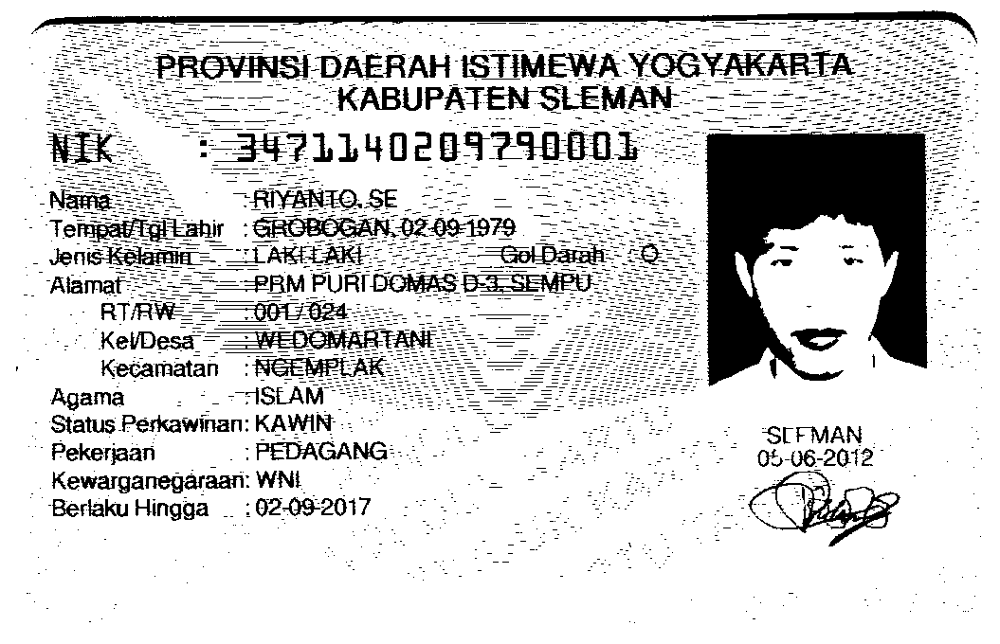

In [32]:
gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY+ cv.THRESH_OTSU)
print(ret, bw.shape)
cv2_imshow(bw)

In [33]:
erode = cv2.erode(bw.copy(),
cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

In [34]:
contours, hierarchy = cv2.findContours(erode.copy(),cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
  x, y, w, h = cv2.boundingRect(cnt)
ras = format(w / h, '.2f')
if h >= 40 and w >= 10 and float(ras) <= 1:
  cv2.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 255,0), thickness=1)
  print("+ x={}, y={}, w={}, h={}, rasio={}".format(x,y, w, h, ras))

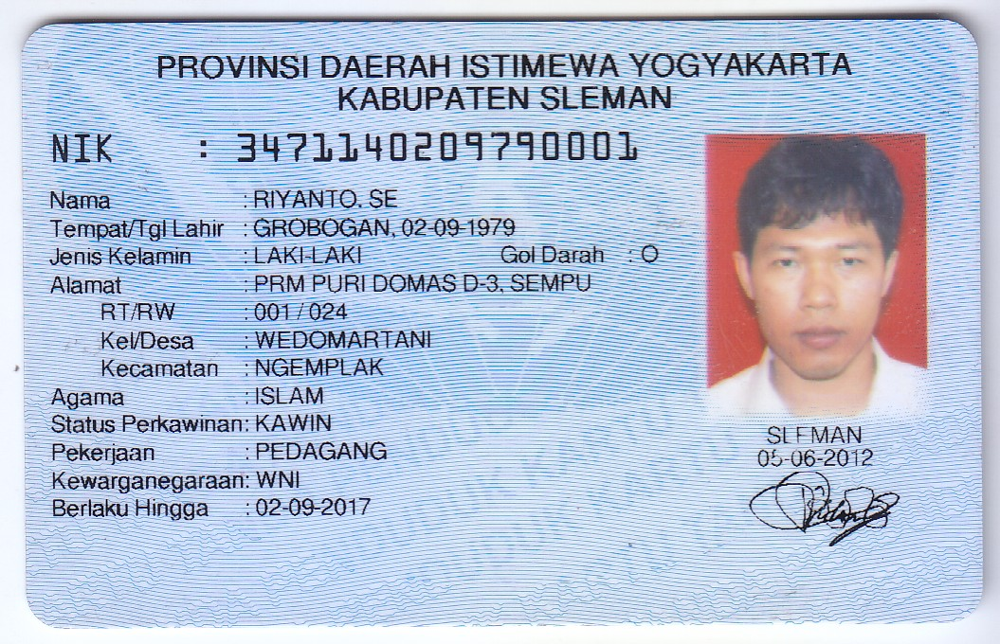

In [35]:
cv2_imshow(ktpImage)

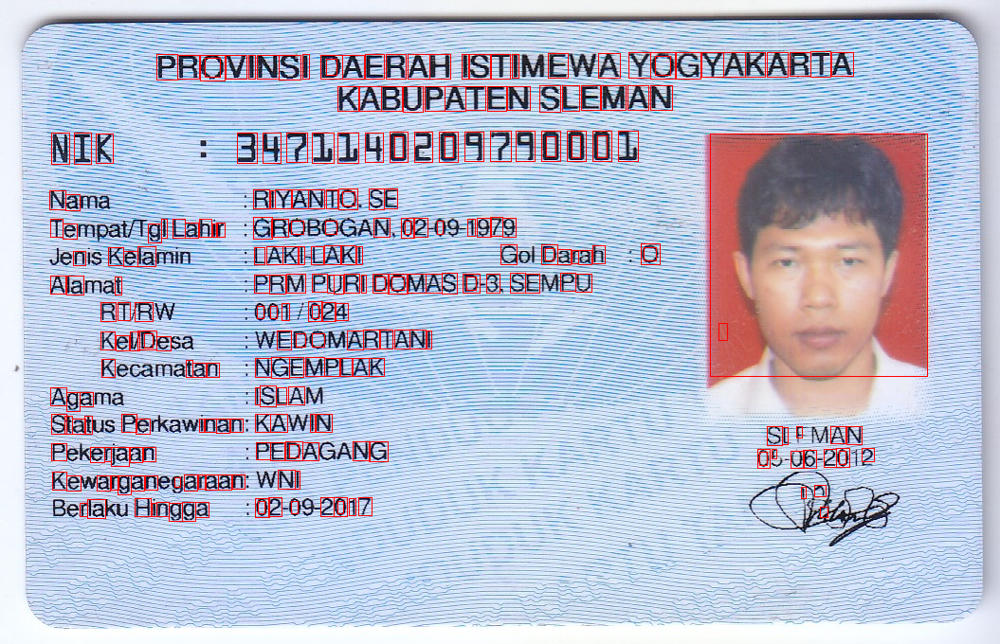

In [37]:
# Baca gambar KTP
ktpImage = cv2.imread('/content/drive/MyDrive/KTP_More/ktp.png')

# Ubah gambar menjadi skala abu-abu untuk deteksi tepi
gray = cv2.cvtColor(ktpImage, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

# Thresholding untuk membuat gambar biner
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Deteksi tepi menggunakan Canny


# Temukan kontur pada gambar tepi
contours,  hierarchy= cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Tampilkan gambar dengan kontur
cv2_imshow(ktpImage)